In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
import pmdarima as pm
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [2]:
df_train = pd.read_csv('train.csv')
df_train.head()

,application_date,segment,branch_id,state,zone,case_count
0,2017-04-01,1,1.0,WEST BENGAL,EAST,40.0
1,2017-04-03,1,1.0,WEST BENGAL,EAST,5.0
2,2017-04-04,1,1.0,WEST BENGAL,EAST,4.0
3,2017-04-05,1,1.0,WEST BENGAL,EAST,113.0
4,2017-04-07,1,1.0,WEST BENGAL,EAST,76.0


In [3]:
df_test= pd.read_csv('test.csv')
df_s1test=df_test[df_test['segment']==1]
df_s1test.tail()

,id,application_date,segment
82,83,2019-09-26,1
83,84,2019-09-27,1
84,85,2019-09-28,1
85,86,2019-09-29,1
86,87,2019-09-30,1


In [4]:
df_train.application_date=pd.to_datetime(df_train.application_date)
df_test.application_date=pd.to_datetime(df_test.application_date)
df_train.isna().sum()

application_date        0
segment                 0
branch_id           13504
state                   0
zone                13504
case_count              0
dtype: int64

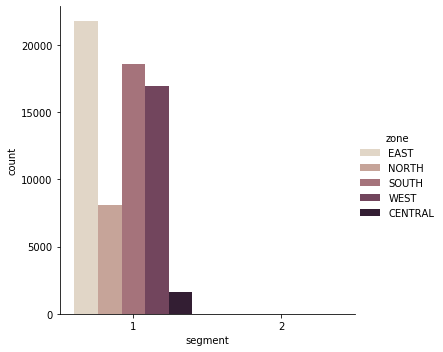

In [5]:
sns.catplot(x="segment", hue="zone",kind="count", palette="ch:.25", data=df_train);

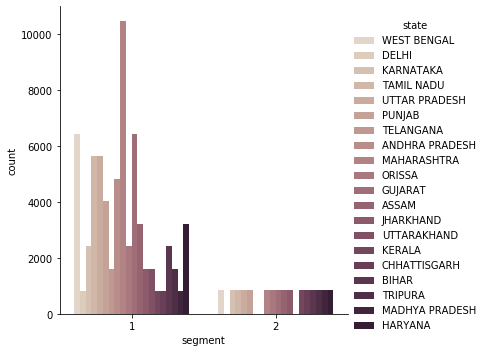

In [6]:
sns.catplot(x="segment", hue="state",kind="count", palette="ch:.25", data=df_train);

In [24]:
df_train_temp=df_train.groupby(["application_date","segment","zone"]).sum()
df_train_agg=df_train_temp['case_count'].unstack()
df_train_agg.tail(40)

,zone,CENTRAL,EAST,NORTH,SOUTH,WEST
application_date,segment,,,,,
2019-05-27,1,69.0,1342.0,510.0,944.0,1015.0
2019-05-28,1,57.0,1075.0,427.0,782.0,904.0
2019-05-29,1,63.0,1184.0,468.0,900.0,904.0
2019-05-30,1,93.0,1251.0,423.0,889.0,1040.0
2019-05-31,1,81.0,1322.0,458.0,897.0,959.0
2019-06-01,1,35.0,954.0,190.0,693.0,812.0
2019-06-02,1,55.0,947.0,474.0,216.0,256.0
2019-06-03,1,66.0,1876.0,482.0,1062.0,1034.0
2019-06-04,1,88.0,2126.0,466.0,863.0,1214.0


In [9]:
df_train_agg_list=[pd.DataFrame()]*5
i=0
for X in df_train_agg:
    df_train_agg_list[i] = df_train_agg[X].unstack()
    print(X,'no. of NaNs', df_train_agg_list[i][1].isna().sum())
    i=i+1

CENTRAL no. of NaNs 0
EAST no. of NaNs 0
NORTH no. of NaNs 0
SOUTH no. of NaNs 0
WEST no. of NaNs 0


//anaconda3/lib/python3.7/site-packages/pandas/plotting/_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


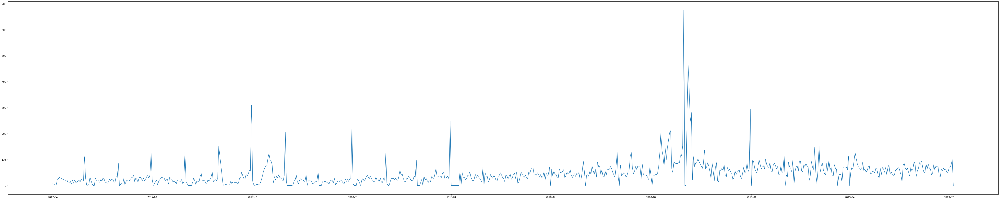

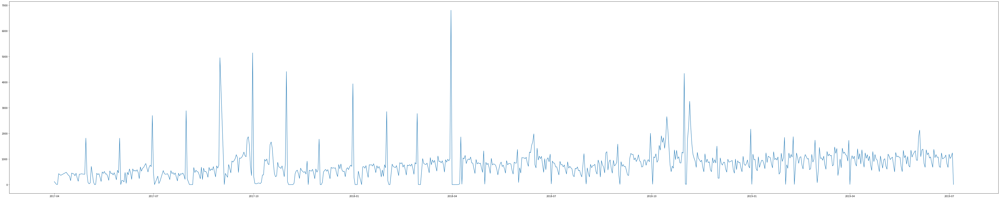

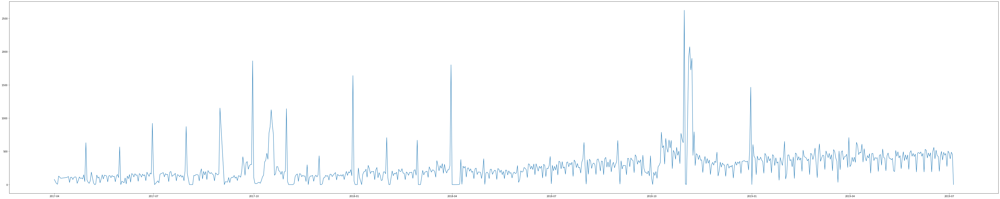

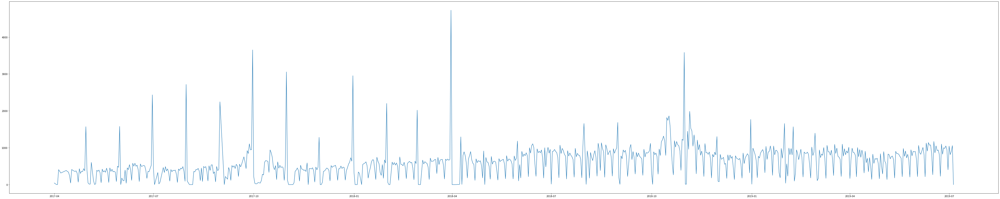

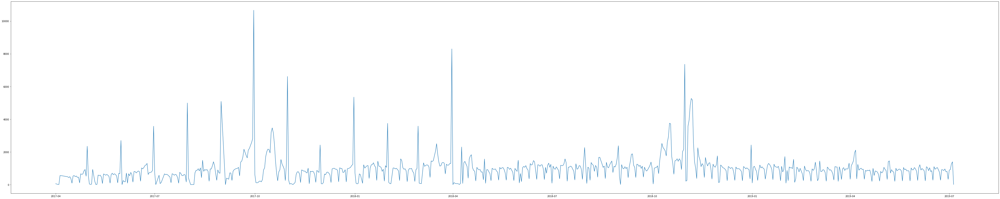

In [10]:
for i in range(len(df_train_agg_list)):
    plt.figure(figsize=(75,15))
    plt.plot(df_train_agg_list[i])
    plt.show()

In [16]:
df_train_agglog_list=[pd.DataFrame()]*5
for i in range(len(df_train_agg_list)):
    df_train_agglog_list[i] = np.log(df_train_agg_list[i])
    #plt.figure(figsize=(75,15))
    #plt.plot(df_train_agglog_list[i])
    #plt.show()
    print(i,'no. of NaNs', df_train_agglog_list[i][1].isna().sum())

0 no. of NaNs 0
1 no. of NaNs 0
2 no. of NaNs 0
3 no. of NaNs 0
4 no. of NaNs 0


//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log
  This is separate from the ipykernel package so we can avoid doing imports until


In [33]:
df_detrended=[pd.DataFrame()]*5
df_train_detrended=[pd.DataFrame()]*5
df_test_detrended=[pd.DataFrame()]*5
df_trend=[pd.DataFrame()]*5
df_train_trend=[pd.DataFrame()]*5
df_test_trend=[pd.DataFrame()]*5
result_muls=[pd.DataFrame()]*5
df_sub=[pd.DataFrame()]*5

for i in range(len(df_train_agglog_list)):
    
    result_muls[i] = seasonal_decompose(df_train_agg_list[i][1]['2018-03-05':'2019-07-05'],model='additive')
    
    #df_detrended[i]=pd.DataFrame((df_train_agg_list[i][1]-result_muls[i].trend)['2018-03-09':'2019-07-01'])
    df_detrended[i]=pd.DataFrame((df_train_agg_list[i][1])['2018-03-05':'2019-07-05'])
    
    df_train_detrended[i] = pd.DataFrame(df_detrended[i]['2018-03-05':'2019-04-04'])
    
    df_test_detrended[i] = pd.DataFrame(df_detrended[i]['2019-04-05':'2019-07-05'])
    
    df_sub[i]=pd.DataFrame(df_detrended[i]['2018-03-09':'2019-07-05'])
    
    #df_train_trend[i] = pd.DataFrame(df_trend[i]['2018-03-09':'2019-04-04'])
    
    #df_test_trend[i] = pd.DataFrame(df_s1test['2019-04-05':'2019-07-01'])

In [60]:
df_train_detrended[0].head(20)

,1,month end
application_date,,
2018-03-05,24.0,0
2018-03-06,0.0,0
2018-03-07,37.0,0
2018-03-08,21.0,0
2018-03-09,27.0,0
2018-03-10,19.0,1
2018-03-11,12.0,1
2018-03-12,22.0,0
2018-03-13,15.0,0


In [35]:
smodel=[pd.DataFrame()]*5

for i in range(5):
    smodel[i] = pm.auto_arima(df_train_detrended[i][1], start_p=1, start_q=1,
                         test='adf',
                         max_p=7, max_q=7, m=7,
                         start_P=0, seasonal=True,
                         d=None, D=1, trace=True,stationary=False,
                         error_action='ignore',  
                         suppress_warnings=True, 
                         stepwise=True)

Fit ARIMA: order=(1, 0, 1) seasonal_order=(0, 1, 1, 7); AIC=4165.507, BIC=4185.325, Fit time=1.013 seconds
Fit ARIMA: order=(0, 0, 0) seasonal_order=(0, 1, 0, 7); AIC=4365.279, BIC=4373.206, Fit time=0.048 seconds
Fit ARIMA: order=(1, 0, 0) seasonal_order=(1, 1, 0, 7); AIC=4280.215, BIC=4296.069, Fit time=0.314 seconds
Fit ARIMA: order=(0, 0, 1) seasonal_order=(0, 1, 1, 7); AIC=4199.217, BIC=4215.071, Fit time=0.293 seconds
Fit ARIMA: order=(0, 0, 0) seasonal_order=(0, 1, 0, 7); AIC=4363.329, BIC=4367.293, Fit time=0.017 seconds
Fit ARIMA: order=(1, 0, 1) seasonal_order=(0, 1, 0, 7); AIC=4345.606, BIC=4361.461, Fit time=0.230 seconds
Fit ARIMA: order=(1, 0, 1) seasonal_order=(1, 1, 1, 7); AIC=4163.609, BIC=4187.391, Fit time=1.327 seconds
Near non-invertible roots for order (1, 0, 1)(1, 1, 1, 7); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: order=(1, 0, 1) seasonal_order=(0, 1, 2, 7); AIC=4163.420, BIC=4187.202, Fit time=

Fit ARIMA: order=(2, 0, 1) seasonal_order=(0, 1, 1, 7); AIC=5339.228, BIC=5363.009, Fit time=1.619 seconds
Near non-invertible roots for order (2, 0, 1)(0, 1, 1, 7); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: order=(1, 0, 2) seasonal_order=(0, 1, 1, 7); AIC=5332.432, BIC=5356.213, Fit time=1.333 seconds
Fit ARIMA: order=(0, 0, 0) seasonal_order=(0, 1, 1, 7); AIC=5414.505, BIC=5426.396, Fit time=0.362 seconds
Fit ARIMA: order=(0, 0, 2) seasonal_order=(0, 1, 1, 7); AIC=5359.566, BIC=5379.384, Fit time=0.807 seconds
Fit ARIMA: order=(2, 0, 0) seasonal_order=(0, 1, 1, 7); AIC=5344.772, BIC=5364.590, Fit time=0.861 seconds
Fit ARIMA: order=(2, 0, 2) seasonal_order=(0, 1, 1, 7); AIC=5329.749, BIC=5357.494, Fit time=2.269 seconds
Near non-invertible roots for order (2, 0, 2)(0, 1, 1, 7); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 16.707 seconds
Fit ARIMA: 

In [78]:
for i in range(5):
    
    df_train_detrended[i]['month end'] = df_train_detrended[i].index.weekday == 6
    df_test_detrended[i]['month end'] = df_test_detrended[i].index.weekday == 6
    #df_train_trend[i]['month end'] = df_train_trend[i].index.day == (30 or 31)
    #df_test_trend[i]['month end'] = df_test_trend[i].index.day == (30 or 31)
    
    df_train_detrended[i]['month end'] = df_train_detrended[i]['month end'].astype(int)
    df_test_detrended[i]['month end'] = df_test_detrended[i]['month end'].astype(int)
    #df_train_trend[i]['month end'] = df_train_trend[i]['month end'].astype(int)
    #df_test_trend[i]['month end'] = df_test_trend[i]['month end'].astype(int)
    
    df_sub[i]['month end'] = df_sub[i].index.weekday == 6
    df_sub[i]['month end'] = df_sub[i]['month end'].astype(int)

    
df_s1test.application_date=pd.to_datetime(df_s1test.application_date)

df_s1test.index=df_s1test.application_date

del df_s1test['application_date']

df_s1test
df_s1test['month end'] = df_s1test.index.weekday == 6
df_s1test['month end'] = df_s1test['month end'].astype(int)

//anaconda3/lib/python3.7/site-packages/pandas/core/generic.py:5096: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[name] = value
//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/index

In [79]:
df_s1test.head()

,id,segment,month end
application_date,,,
2019-07-06,1,1,0
2019-07-07,2,1,1
2019-07-08,3,1,0
2019-07-09,4,1,0
2019-07-10,5,1,0


In [71]:
sarimax1s=[pd.DataFrame()]*5

for i in range(5):
    sarimax1s[i] = sm.tsa.statespace.SARIMAX(df_train_detrended[i][1],
                                             exog=df_train_detrended[i]['month end'],
                                             order=smodel[i].order,seasonal_order=smodel[i].seasonal_order,
                                            enforce_stationarity=False, 
                                             enforce_invertibility=False,).fit()
    print(sarimax1s[i].summary())

//anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                                 Statespace Model Results                                
Dep. Variable:                                 1   No. Observations:                  396
Model:             SARIMAX(1, 0, 1)x(0, 1, 2, 7)   Log Likelihood               -1997.618
Date:                           Sun, 26 Jan 2020   AIC                           4007.236
Time:                                   19:37:51   BIC                           4030.766
Sample:                               03-05-2018   HQIC                          4016.580
                                    - 04-04-2019                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
month end  -1.427e-05    9.7e-10  -1.47e+04      0.000   -1.43e-05   -1.43e-05
ar.L1          0.9280      0.022     42.530

//anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
//anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
//anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                                 Statespace Model Results                                
Dep. Variable:                                 1   No. Observations:                  396
Model:             SARIMAX(1, 0, 1)x(1, 1, 2, 7)   Log Likelihood               -2858.295
Date:                           Sun, 26 Jan 2020   AIC                           5730.590
Time:                                   19:37:55   BIC                           5758.042
Sample:                               03-05-2018   HQIC                          5741.491
                                    - 04-04-2019                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
month end     -0.0066   3539.515  -1.86e-06      1.000   -6937.329    6937.315
ar.L1          0.9355      0.064     14.652

//anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                                 Statespace Model Results                                
Dep. Variable:                                 1   No. Observations:                  396
Model:             SARIMAX(1, 0, 0)x(2, 1, 1, 7)   Log Likelihood               -2757.813
Date:                           Sun, 26 Jan 2020   AIC                           5527.626
Time:                                   19:37:58   BIC                           5551.171
Sample:                               03-05-2018   HQIC                          5536.975
                                    - 04-04-2019                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
month end     -0.0002   2.53e+04  -8.51e-09      1.000   -4.97e+04    4.97e+04
ar.L1          0.1209      0.034      3.517

//anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                                 Statespace Model Results                                
Dep. Variable:                                 1   No. Observations:                  396
Model:             SARIMAX(1, 0, 2)x(0, 1, 1, 7)   Log Likelihood               -3027.319
Date:                           Sun, 26 Jan 2020   AIC                           6066.638
Time:                                   19:38:00   BIC                           6090.263
Sample:                               03-05-2018   HQIC                          6076.013
                                    - 04-04-2019                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
month end     -0.3037   3014.940     -0.000      1.000   -5909.477    5908.869
ar.L1          0.9376      0.040     23.411

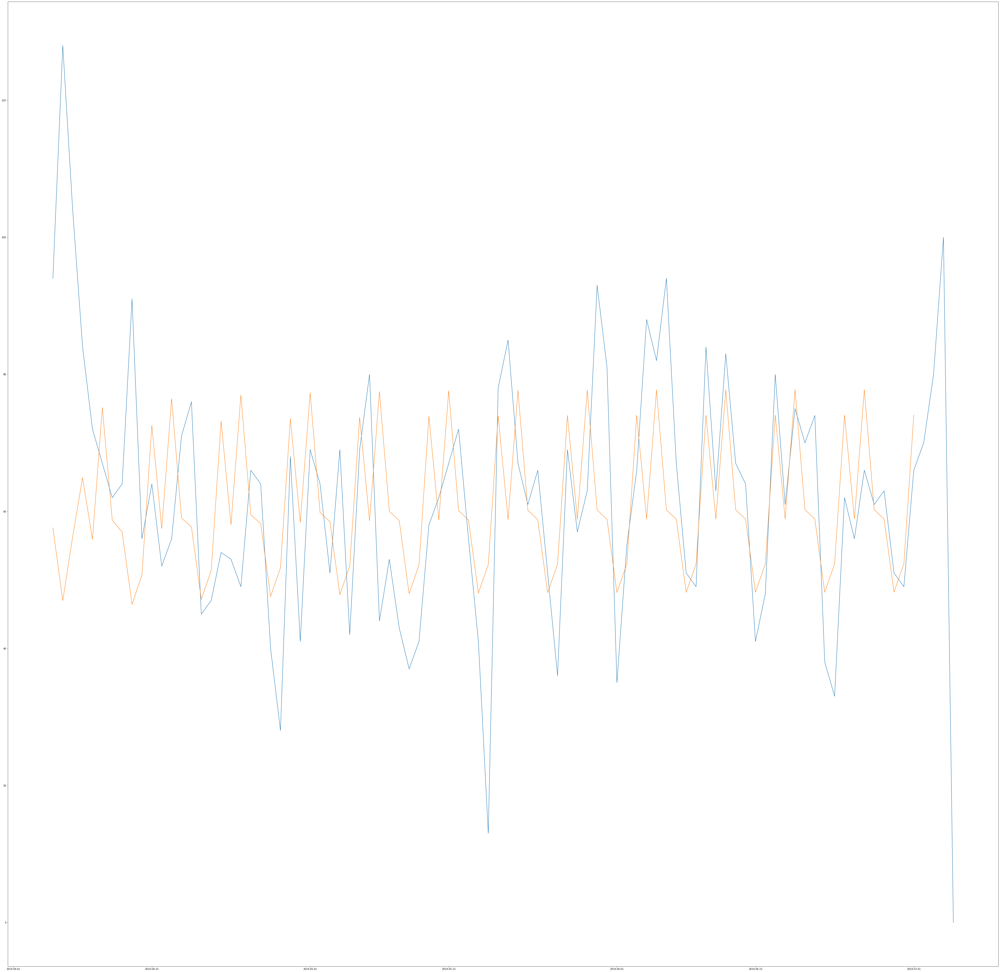

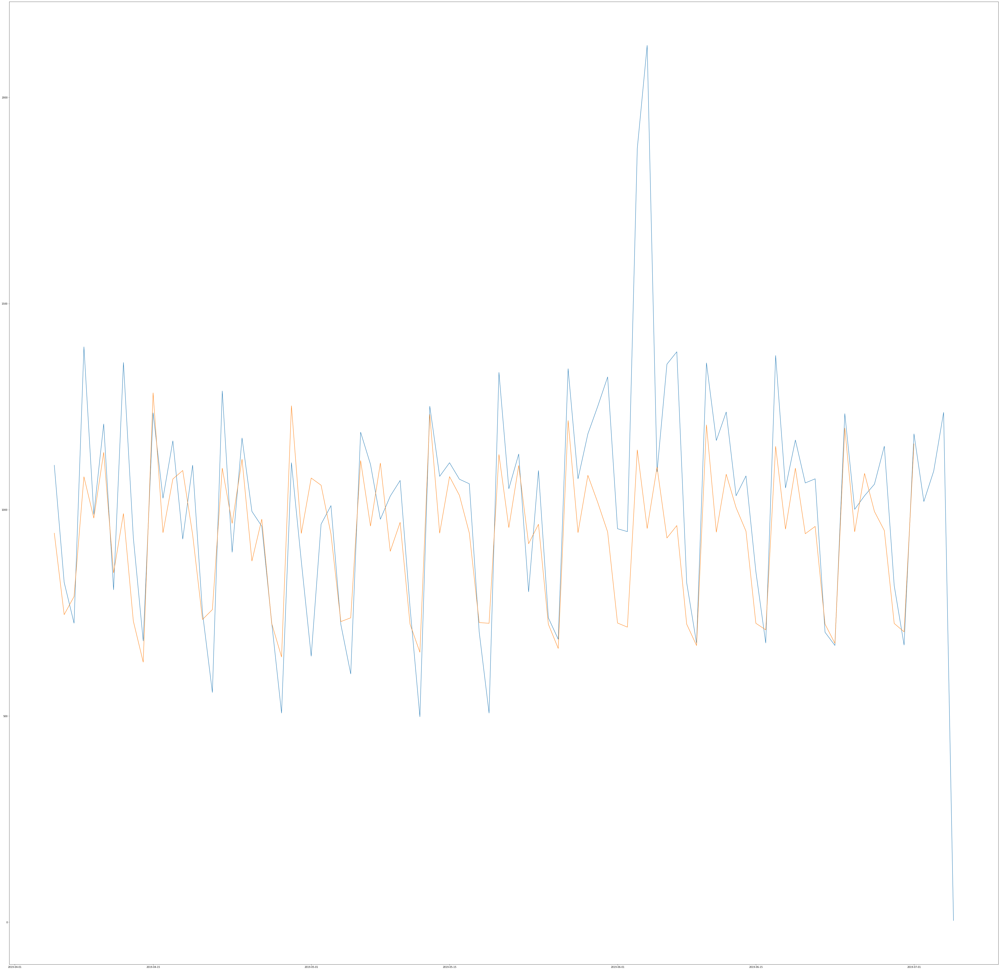

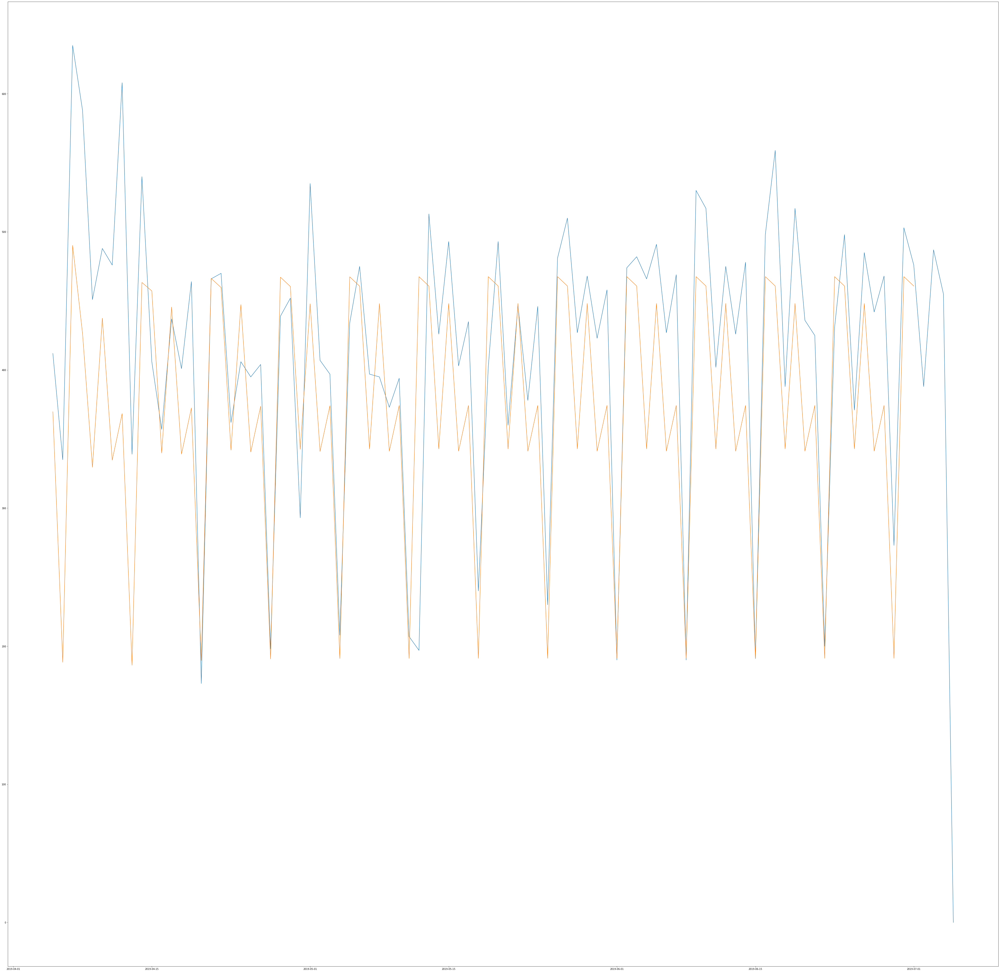

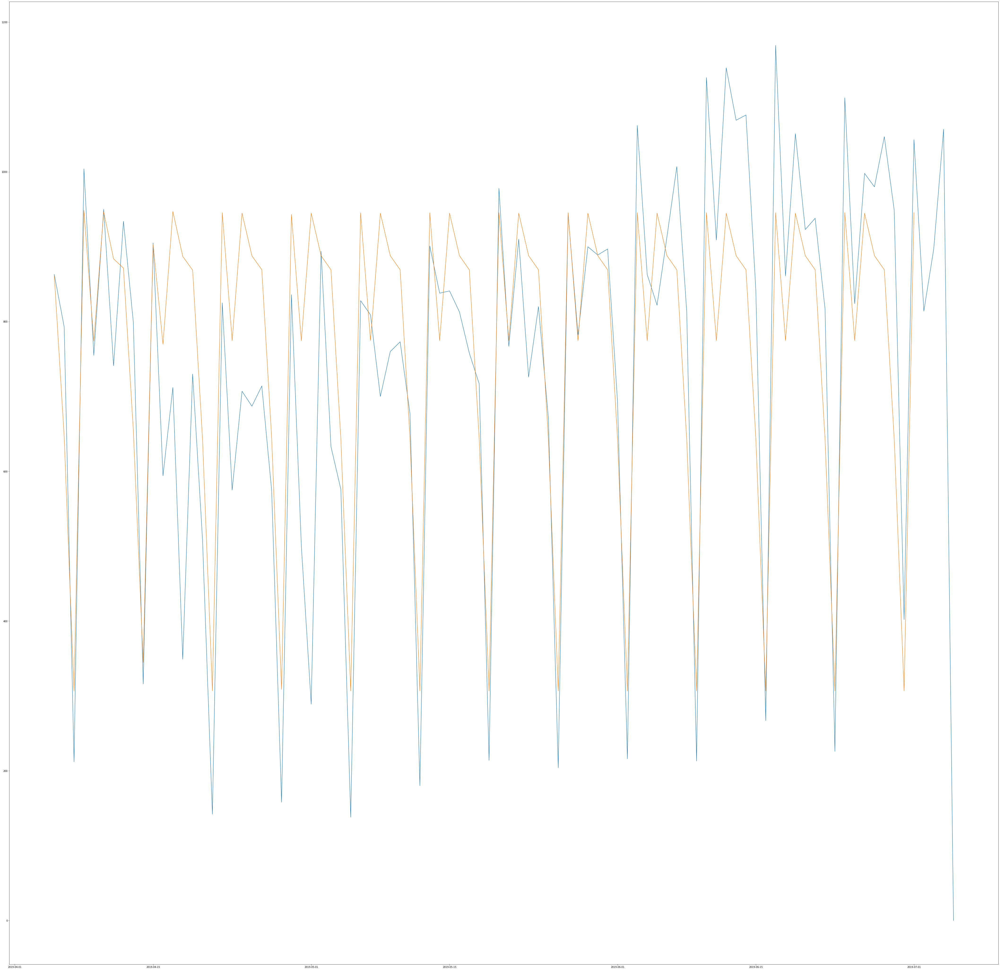

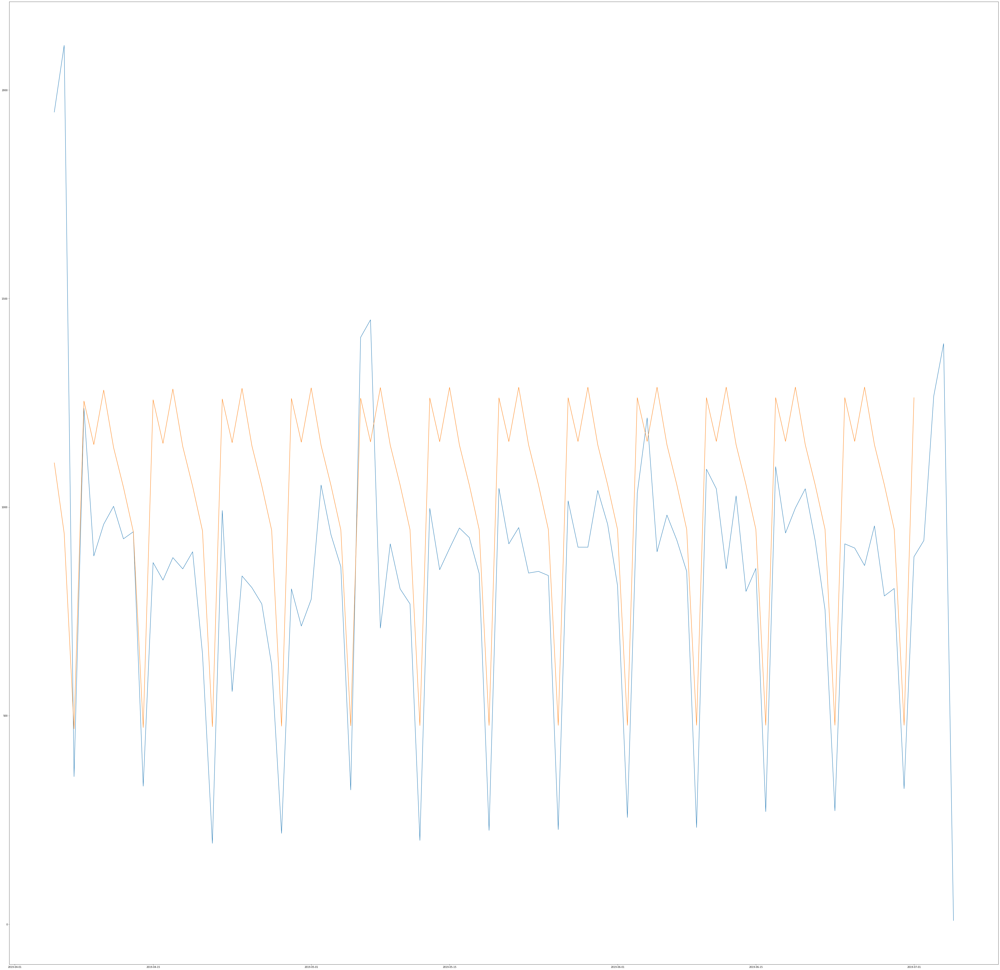

In [72]:
df_test_detrended_pred=[pd.DataFrame()]*5

for i in range(5):
    
    #df_test_detrended[i].index = pd.DatetimeIndex(train.index.values,
     #                          freq=train.index.inferred_freq)
    
    df_test_detrended_pred[i]=sarimax1s[i].predict(start ='2019-04-05', 
                                                   end ='2019-07-01', freq='D',
                                                   exog = pd.DataFrame(df_test_detrended[i]['month end']['2019-04-05':'2019-07-01']), 
                                                   dynamic = False)
    
    df_test_detrended_pred[i]=pd.DataFrame(df_test_detrended_pred[i])
    
    plt.figure(figsize=(75,75))
    plt.plot(df_test_detrended[i][1])
    plt.plot(df_test_detrended_pred[i][0])

In [74]:
df_seg1=df_test_detrended[0].copy()
df_seg1_pred=df_test_detrended_pred[0].copy()
for i in range(1,5):
    df_seg1_pred=df_seg1_pred+df_test_detrended_pred[i]
    df_seg1=df_seg1+df_test_detrended[i]

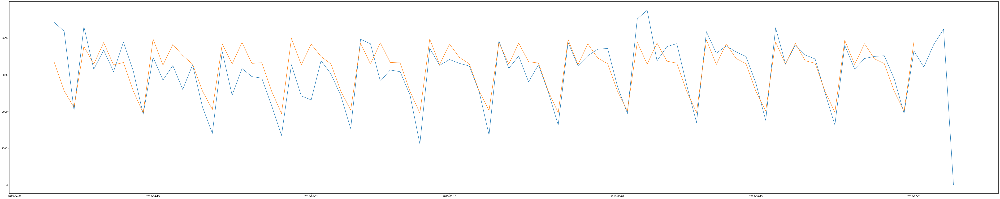

ARIMA model MSE:13.245186583450014


In [75]:
plt.figure(figsize=(75,15))
plt.plot(df_seg1[1])
plt.plot(df_seg1_pred[0])
plt.show()

print('ARIMA model MSE:{}'.format(100*np.mean((abs(df_seg1[1]-
                                          df_seg1_pred[0])/df_seg1[1]))))

Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 1, 7); AIC=5048.110, BIC=5068.937, Fit time=1.086 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 7); AIC=5460.737, BIC=5469.068, Fit time=0.032 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(1, 1, 0, 7); AIC=5306.034, BIC=5322.695, Fit time=0.399 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 1, 7); AIC=5022.704, BIC=5039.366, Fit time=0.579 seconds
Near non-invertible roots for order (0, 1, 1)(0, 1, 1, 7); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 7); AIC=5458.738, BIC=5462.904, Fit time=0.022 seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 0, 7); AIC=5240.260, BIC=5256.922, Fit time=0.297 seconds
Near non-invertible roots for order (1, 1, 1)(0, 1, 0, 7); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: order=(1, 1, 1) seasonal_order=

//anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                                 Statespace Model Results                                
Dep. Variable:                                 1   No. Observations:                  484
Model:             SARIMAX(2, 1, 1)x(0, 1, 1, 7)   Log Likelihood               -2455.691
Date:                           Sun, 26 Jan 2020   AIC                           4923.381
Time:                                   19:46:28   BIC                           4948.259
Sample:                               03-09-2018   HQIC                          4933.171
                                    - 07-05-2019                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
month end  -9.547e-05   3.58e+04  -2.67e-09      1.000   -7.02e+04    7.02e+04
ar.L1          0.0399      0.028      1.424

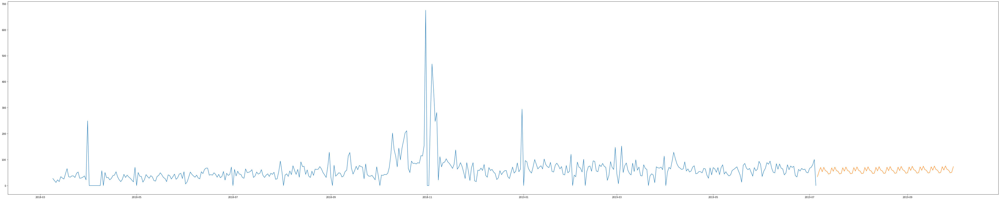

Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 1, 7); AIC=7252.973, BIC=7273.800, Fit time=1.282 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 7); AIC=7788.424, BIC=7796.755, Fit time=0.041 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(1, 1, 0, 7); AIC=7551.322, BIC=7567.984, Fit time=0.487 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 1, 7); AIC=7245.779, BIC=7262.441, Fit time=0.692 seconds
Near non-invertible roots for order (0, 1, 1)(0, 1, 1, 7); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 7); AIC=7786.428, BIC=7790.594, Fit time=0.020 seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 0, 7); AIC=7522.191, BIC=7538.853, Fit time=0.483 seconds
Near non-invertible roots for order (1, 1, 1)(0, 1, 0, 7); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: order=(1, 1, 1) seasonal_order=

//anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
//anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                 Statespace Model Results                                
Dep. Variable:                                 1   No. Observations:                  484
Model:             SARIMAX(2, 1, 2)x(0, 1, 1, 7)   Log Likelihood               -3550.646
Date:                           Sun, 26 Jan 2020   AIC                           7115.292
Time:                                   19:46:51   BIC                           7144.301
Sample:                               03-09-2018   HQIC                          7126.709
                                    - 07-05-2019                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
month end      0.0250   4339.953   5.77e-06      1.000   -8506.126    8506.176
ar.L1         -0.0869      0.413     -0.210

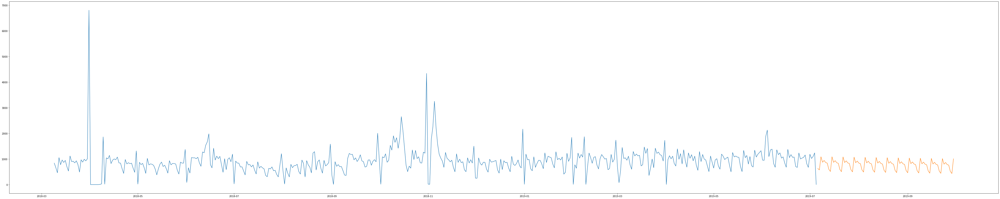

Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 1, 7); AIC=6452.111, BIC=6472.938, Fit time=1.196 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 7); AIC=6850.883, BIC=6859.214, Fit time=0.036 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(1, 1, 0, 7); AIC=6682.470, BIC=6699.132, Fit time=0.431 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 1, 7); AIC=6456.491, BIC=6473.152, Fit time=0.871 seconds
Near non-invertible roots for order (0, 1, 1)(0, 1, 1, 7); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 7); AIC=6848.887, BIC=6853.053, Fit time=0.027 seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 0, 7); AIC=6656.099, BIC=6672.760, Fit time=0.533 seconds
Near non-invertible roots for order (1, 1, 1)(0, 1, 0, 7); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: order=(1, 1, 1) seasonal_order=

//anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                                 Statespace Model Results                                
Dep. Variable:                                 1   No. Observations:                  484
Model:             SARIMAX(1, 1, 1)x(0, 1, 2, 7)   Log Likelihood               -3083.357
Date:                           Sun, 26 Jan 2020   AIC                           6178.714
Time:                                   19:47:13   BIC                           6203.502
Sample:                               03-09-2018   HQIC                          6188.475
                                    - 07-05-2019                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
month end      0.0107    3.4e+04   3.15e-07      1.000   -6.66e+04    6.66e+04
ar.L1          0.2822      0.022     12.801

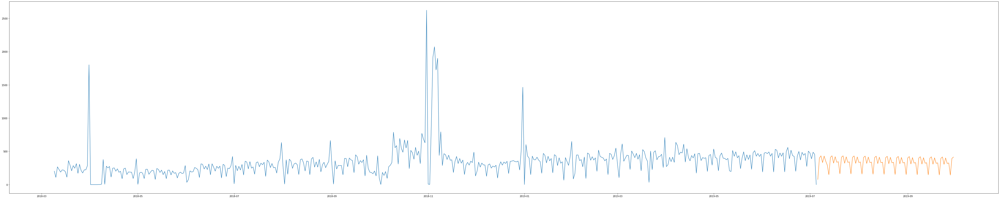

Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 1, 7); AIC=6944.724, BIC=6965.551, Fit time=1.221 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 7); AIC=7506.411, BIC=7514.742, Fit time=0.027 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(1, 1, 0, 7); AIC=7260.664, BIC=7277.326, Fit time=0.377 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 1, 7); AIC=6951.107, BIC=6967.768, Fit time=0.820 seconds
Near non-invertible roots for order (0, 1, 1)(0, 1, 1, 7); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 7); AIC=7504.418, BIC=7508.583, Fit time=0.019 seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 0, 7); AIC=7209.864, BIC=7226.525, Fit time=0.458 seconds
Near non-invertible roots for order (1, 1, 1)(0, 1, 0, 7); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: order=(1, 1, 1) seasonal_order=

//anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                                 Statespace Model Results                                
Dep. Variable:                                 1   No. Observations:                  484
Model:             SARIMAX(2, 1, 1)x(0, 1, 1, 7)   Log Likelihood               -3395.677
Date:                           Sun, 26 Jan 2020   AIC                           6803.355
Time:                                   19:47:33   BIC                           6828.233
Sample:                               03-09-2018   HQIC                          6813.145
                                    - 07-05-2019                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
month end     -0.0963   2868.389  -3.36e-05      1.000   -5622.036    5621.844
ar.L1          0.0342      0.028      1.227

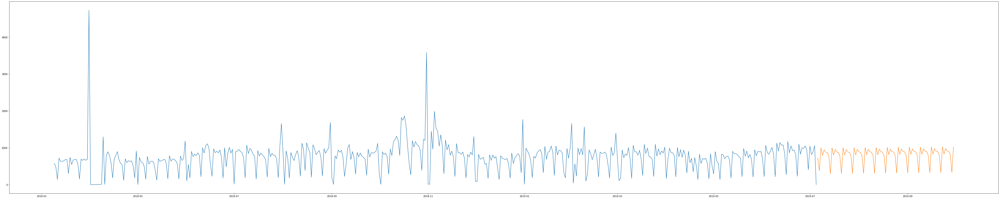

Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 1, 7); AIC=7533.468, BIC=7554.295, Fit time=1.617 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 7); AIC=7991.247, BIC=7999.578, Fit time=0.045 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(1, 1, 0, 7); AIC=7781.902, BIC=7798.564, Fit time=0.572 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 1, 7); AIC=7549.610, BIC=7566.272, Fit time=1.245 seconds
Near non-invertible roots for order (0, 1, 1)(0, 1, 1, 7); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 7); AIC=7989.252, BIC=7993.417, Fit time=0.029 seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 0, 7); AIC=7786.951, BIC=7803.613, Fit time=0.586 seconds
Near non-invertible roots for order (1, 1, 1)(0, 1, 0, 7); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: order=(1, 1, 1) seasonal_order=

//anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                                 Statespace Model Results                                
Dep. Variable:                                 1   No. Observations:                  484
Model:             SARIMAX(1, 1, 1)x(0, 1, 1, 7)   Log Likelihood               -3689.965
Date:                           Sun, 26 Jan 2020   AIC                           7389.930
Time:                                   19:47:57   BIC                           7410.662
Sample:                               03-09-2018   HQIC                          7398.089
                                    - 07-05-2019                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
month end     -0.5693   1405.700     -0.000      1.000   -2755.691    2754.552
ar.L1          0.2277      0.022     10.178

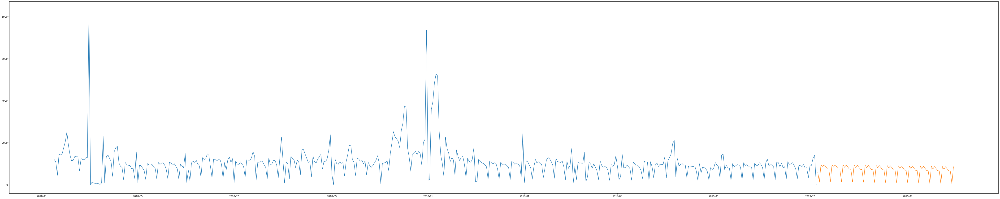

In [80]:
sarimax2s=[pd.DataFrame()]*5
df_test_trend_pred=[pd.DataFrame()]*5
smodel2=[pd.DataFrame()]*5

for i in range(5):
    
    smodel2[i] = pm.auto_arima(df_sub[i][1], start_p=1, start_q=1,
                         test='adf',
                         max_p=7, max_q=7, m=7,
                         start_P=0, seasonal=True,
                         d=1, D=1, trace=True,stationary=False,
                         error_action='ignore',  
                         suppress_warnings=True, 
                         stepwise=True)
    
    sarimax2s[i] = sm.tsa.statespace.SARIMAX(df_sub[i][1],
                                             exog=df_sub[i]['month end'],
                                             order=smodel2[i].order,seasonal_order=smodel2[i].seasonal_order,
                                             enforce_stationarity=False, 
                                             enforce_invertibility=False,).fit()
    print(sarimax2s[i].summary())
    
    df_test_trend_pred[i]=sarimax2s[i].predict(start ='2019-07-06', 
                                                   end ='2019-09-30', freq='D',
                                                   exog = pd.DataFrame(df_s1test['month end']['2019-07-06':'2019-09-30']), 
                                                   dynamic = False)
    
    df_test_trend_pred[i]=pd.DataFrame(df_test_trend_pred[i])
    
    plt.figure(figsize=(75,15))
    plt.plot(df_sub[i][1])
    plt.plot(df_test_trend_pred[i][0])
    plt.show()

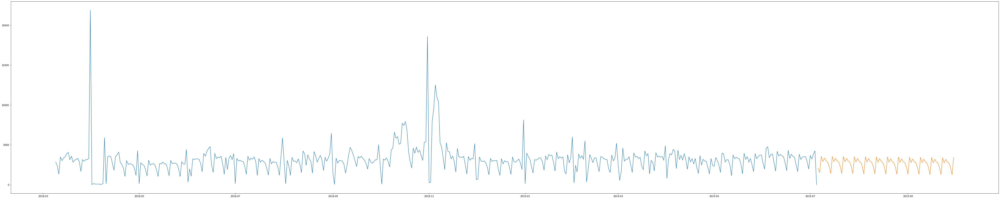

In [84]:
df_seg1sub=df_sub[0].copy()
df_seg1sub_pred=df_test_trend_pred[0].copy()
for i in range(1,5):
    df_seg1sub_pred=df_seg1sub_pred+df_test_trend_pred[i]
    df_seg1sub=df_seg1sub+df_sub[i]
    
plt.figure(figsize=(75,15))
plt.plot(df_seg1sub[1])
plt.plot(df_seg1sub_pred[0])
plt.show()

#print('ARIMA model MSE:{}'.format(100*np.mean((abs(df_seg1[1]-
 ##                                         df_seg1_pred[0])/df_seg1[1]))))

In [83]:
df_seg1sub_pred.to_csv('submissionseg2.csv')

# segment 2

In [419]:
df_train_seg2temp=df_train.groupby(["application_date","segment"]).sum()
df_train_seg2temp2=df_train_seg2temp.unstack()
df_seg2log_train=np.log(pd.DataFrame(df_train_seg2temp2['case_count'][2]))
df_seg2log_train.tail()

,2
application_date,
2019-07-19,10.301525
2019-07-20,10.170571
2019-07-21,9.414668
2019-07-22,10.214349
2019-07-23,10.281342


In [425]:
decomp_seg2 = seasonal_decompose(df_seg2log_train[2]['2017-04-01':'2019-07-23'],model='additive')
df_seg2_detrended_temp=df_seg2log_train[2]-decomp_seg2.trend
df_seg2_detrended=df_seg2_detrended_temp['2017-04-04':'2019-07-20']
df_seg2_detrended = pd.DataFrame(df_seg2_detrended)

In [459]:
df_seg2_detrended['monthend'] = df_seg2_detrended[2] < -1
df_seg2_detrended['monthend'] = df_seg2_detrended['monthend'].astype(int)

df_seg2_detrended['monthmid'] = df_seg2_detrended[2] > .5
df_seg2_detrended['monthmid'] = df_seg2_detrended['monthmid'].astype(int)
df_seg2_detrended.tail()

,2,monthend,monthmid
application_date,,,
2019-07-16,0.179247,0,0
2019-07-17,0.190938,0,0
2019-07-18,0.221314,0,0
2019-07-19,0.129635,0,0
2019-07-20,0.008581,0,0


In [480]:
seg2_detrend_model = pm.auto_arima(df_seg2_detrended[2][:'2019-04-01'], start_p=1, start_q=1,
                         test='adf',
                         max_p=7, max_q=7, m=7,
                         start_P=0, seasonal=True,
                         d=None, D=1, trace=True,stationary=False,
                         error_action='ignore',  
                         suppress_warnings=True, 
                         stepwise=True)

#######

seg2_detrend_model_sarimax = sm.tsa.statespace.SARIMAX(df_seg2_detrended[2][:'2019-05-01'],
                                                       exog=pd.DataFrame(df_seg2_detrended[['monthend','monthmid']][:'2019-05-01']),
                                                       order=seg2_detrend_model.order,
                                                       seasonal_order=seg2_detrend_model.seasonal_order,
                                                       enforce_stationarity=False, enforce_invertibility=False,).fit()
seg2_detrend_model_sarimax.summary()

######

y_seg2_detrend_pred=seg2_detrend_model_sarimax.predict( start='2019-05-02', end='2019-07-20', 
                                                       exog = pd.DataFrame(df_seg2_detrended[['monthend','monthmid']]['2019-05-02':'2019-07-20']),
                                                       dynamic=False)
y_seg2_detrend_pred_df=pd.DataFrame(y_seg2_detrend_pred)

Fit ARIMA: order=(1, 0, 1) seasonal_order=(0, 1, 1, 7); AIC=501.643, BIC=524.547, Fit time=1.746 seconds
Fit ARIMA: order=(0, 0, 0) seasonal_order=(0, 1, 0, 7); AIC=1087.883, BIC=1097.044, Fit time=0.108 seconds
Fit ARIMA: order=(1, 0, 0) seasonal_order=(1, 1, 0, 7); AIC=830.279, BIC=848.602, Fit time=0.476 seconds
Fit ARIMA: order=(0, 0, 1) seasonal_order=(0, 1, 1, 7); AIC=499.660, BIC=517.982, Fit time=1.135 seconds
Near non-invertible roots for order (0, 0, 1)(0, 1, 1, 7); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: order=(0, 0, 0) seasonal_order=(0, 1, 0, 7); AIC=1085.883, BIC=1090.464, Fit time=0.032 seconds
Fit ARIMA: order=(1, 0, 1) seasonal_order=(0, 1, 0, 7); AIC=954.471, BIC=972.793, Fit time=0.253 seconds
Fit ARIMA: order=(1, 0, 1) seasonal_order=(1, 1, 1, 7); AIC=503.575, BIC=531.059, Fit time=2.091 seconds
Near non-invertible roots for order (1, 0, 1)(1, 1, 1, 7); setting score to inf (at least one inverse r

//anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


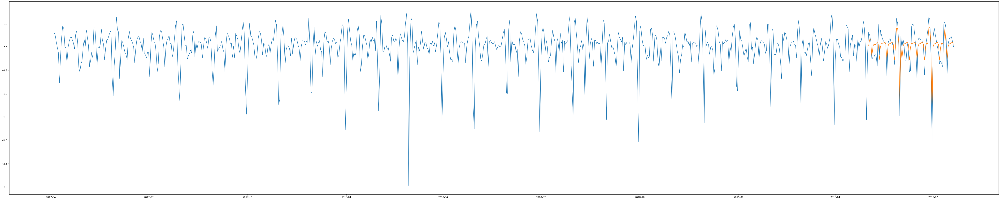

In [481]:
y_seg2_detrend_pred_df

plt.figure(figsize=(75,15))
plt.plot(df_seg2_detrended[2])
plt.plot(y_seg2_detrend_pred_df[0])

segment2 trend part

In [466]:
df_seg2_trend_temp=pd.DataFrame(decomp_seg2.trend)
df_seg2_trend=df_seg2_trend_temp['2017-04-04':'2019-07-20']
df_seg2_trend = pd.DataFrame(df_seg2_trend)

In [467]:
df_seg2_trend.tail()

,2
application_date,
2019-07-16,10.171391
2019-07-17,10.170101
2019-07-18,10.169126
2019-07-19,10.171890
2019-07-20,10.161991


In [403]:
seg2_trend_model = pm.auto_arima(df_seg2_trend[2][:'2019-04-01'], start_p=1, start_q=1,
                         test='adf',
                         max_p=1, max_q=1, m=30,
                         start_P=0, seasonal=True,
                         d=None, D=1, trace=True,stationary=False,
                         error_action='ignore',  
                         suppress_warnings=True, 
                         stepwise=True)

#######

seg2_trend_model_sarimax = sm.tsa.statespace.SARIMAX(df_seg2_trend[2][:'2019-04-01'],
                                                       #exog=pd.DataFrame(df_seg2_detrended[['monthend','monthmid']][:'2019-04-01']),
                                                       order=seg2_trend_model.order,
                                                       seasonal_order=seg2_trend_model.seasonal_order,
                                                       enforce_stationarity=False, enforce_invertibility=False,).fit()
print(seg2_trend_model_sarimax.summary())

######

y_seg2_trend_pred=seg2_trend_model_sarimax.predict( start='2019-04-02', end='2019-07-02', 
                                                       #exog = pd.DataFrame(df_seg2_detrended[['monthend','monthmid']]['2019-04-02':'2019-07-05']),
                                                       dynamic=False)
y_seg2_trend_pred_df=pd.DataFrame(y_seg2_trend_pred)

Fit ARIMA: order=(1, 0, 1) seasonal_order=(0, 1, 1, 30); AIC=-1522.642, BIC=-1499.901, Fit time=30.305 seconds
Fit ARIMA: order=(0, 0, 0) seasonal_order=(0, 1, 0, 30); AIC=197.980, BIC=207.076, Fit time=1.405 seconds
Fit ARIMA: order=(1, 0, 0) seasonal_order=(1, 1, 0, 30); AIC=-1311.683, BIC=-1293.490, Fit time=17.920 seconds
Fit ARIMA: order=(0, 0, 1) seasonal_order=(0, 1, 1, 30); AIC=-588.214, BIC=-570.021, Fit time=13.047 seconds
Fit ARIMA: order=(0, 0, 0) seasonal_order=(0, 1, 0, 30); AIC=231.801, BIC=236.349, Fit time=0.693 seconds
Fit ARIMA: order=(1, 0, 1) seasonal_order=(0, 1, 0, 30); AIC=-1402.791, BIC=-1384.598, Fit time=2.470 seconds
Fit ARIMA: order=(1, 0, 1) seasonal_order=(1, 1, 1, 30); AIC=-1520.850, BIC=-1493.560, Fit time=67.997 seconds
Fit ARIMA: order=(1, 0, 1) seasonal_order=(0, 1, 2, 30); AIC=-1520.968, BIC=-1493.679, Fit time=99.568 seconds
Fit ARIMA: order=(1, 0, 1) seasonal_order=(1, 1, 0, 30); AIC=-1486.100, BIC=-1463.359, Fit time=27.358 seconds
Fit ARIMA: ord

//anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                                 Statespace Model Results                                
Dep. Variable:                                 2   No. Observations:                  728
Model:             SARIMAX(2, 0, 2)x(0, 1, 1, 7)   Log Likelihood                 772.822
Date:                           Sun, 26 Jan 2020   AIC                          -1533.644
Time:                                   17:05:15   BIC                          -1506.244
Sample:                               04-04-2017   HQIC                         -1523.060
                                    - 04-01-2019                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.8769      0.024     78.171      0.000       1.830       1.924
ar.L2         -0.9210      0.024    -38.374

In [477]:
seg2_trend_model_sarimax = sm.tsa.statespace.SARIMAX(df_seg2_trend[2][:'2019-05-01'],
                                                       exog=pd.DataFrame(df_seg2_detrended[['monthend','monthmid']][:'2019-05-01']),
                                                       order=(0,0,0),seasonal_order=(0,1,0,30),
                                                       enforce_stationarity=False, enforce_invertibility=False,).fit()
print(seg2_trend_model_sarimax.summary())

######

y_seg2_trend_pred=seg2_trend_model_sarimax.predict( start='2019-05-02', end='2019-07-20', 
                                                       exog = pd.DataFrame(df_seg2_detrended[['monthend','monthmid']]['2019-05-02':'2019-07-20']),
                                                       dynamic=False)
y_seg2_trend_pred_df=pd.DataFrame(y_seg2_trend_pred)

//anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                            Statespace Model Results                            
Dep. Variable:                        2   No. Observations:                  758
Model:             SARIMAX(0, 1, 0, 30)   Log Likelihood                -137.973
Date:                  Sun, 26 Jan 2020   AIC                            281.946
Time:                          17:43:01   BIC                            295.713
Sample:                      04-04-2017   HQIC                           287.258
                           - 05-01-2019                                         
Covariance Type:                    opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
monthend      -0.0318      0.049     -0.649      0.516      -0.128       0.064
monthmid      -0.0942      0.040     -2.338      0.019      -0.173      -0.015
sigma2         0.0856      0.004    

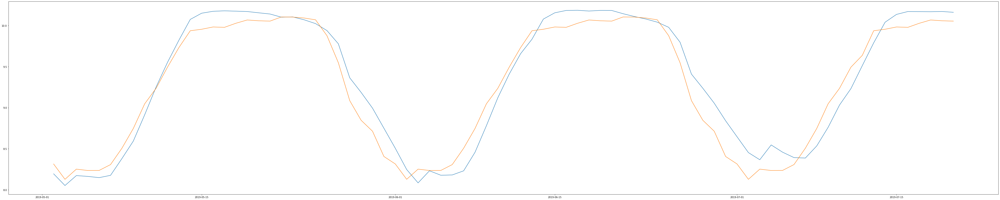

In [479]:
plt.figure(figsize=(75,15))
plt.plot(df_seg2_trend[2]['2019-05-02':'2019-07-20'])
plt.plot(y_seg2_trend_pred_df[0])

In [487]:
y_seg2_pred=y_seg2_trend_pred_df.copy()
y_seg2_pred=y_seg2_pred+y_seg2_detrend_pred_df

In [488]:
y_seg2_pred_original=np.exp(y_seg2_pred)
df_seg2_train=np.exp(df_seg2log_train)

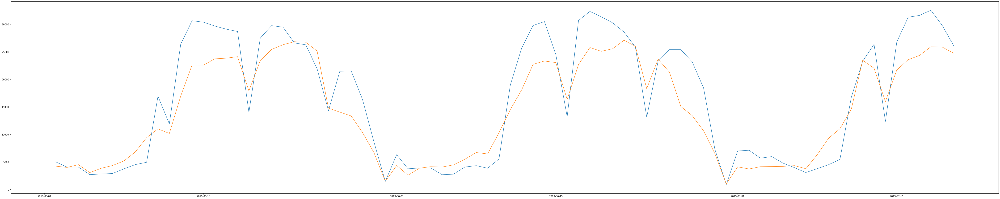

In [491]:
plt.figure(figsize=(75,15))
plt.plot(df_seg2_train[2]['2019-05-02':'2019-07-20'])
plt.plot(y_seg2_pred_original[0])

In [492]:
print('ARIMA model MSE:{}'.format(100*np.mean((abs(df_seg2_train[2]['2019-05-02':'2019-07-20']-
                                          y_seg2_pred_original[0])/df_seg2_train[2]['2019-05-02':'2019-07-20']))))

ARIMA model MSE:27.60050541902436


# SUBMISSION SEGMENT 2

In [493]:
df_train_seg2temp=df_train.groupby(["application_date","segment"]).sum()
df_train_seg2temp2=df_train_seg2temp.unstack()
df_seg2log_train=np.log(pd.DataFrame(df_train_seg2temp2['case_count'][2]))
df_seg2log_train.tail()

,2
application_date,
2019-07-19,10.301525
2019-07-20,10.170571
2019-07-21,9.414668
2019-07-22,10.214349
2019-07-23,10.281342


In [496]:
df_test= pd.read_csv('test.csv')
df_s2test=df_test[df_test['segment']==2]
df_s2test.tail()

,id,application_date,segment
175,176,2019-10-20,2
176,177,2019-10-21,2
177,178,2019-10-22,2
178,179,2019-10-23,2
179,180,2019-10-24,2


In [497]:
decomp_seg2 = seasonal_decompose(df_seg2log_train[2]['2017-04-01':'2019-07-23'],model='additive')
df_seg2_detrended_temp=df_seg2log_train[2]-decomp_seg2.trend
df_seg2_detrended=df_seg2_detrended_temp['2017-04-04':'2019-07-20']
df_seg2_detrended = pd.DataFrame(df_seg2_detrended)

In [501]:
df_seg2_detrended['monthend'] = df_seg2_detrended[2] < -1
df_seg2_detrended['monthend'] = df_seg2_detrended['monthend'].astype(int)

df_seg2_detrended['monthmid'] = df_seg2_detrended[2] > .6
df_seg2_detrended['monthmid'] = df_seg2_detrended['monthmid'].astype(int)
df_seg2_detrended.tail()

,2,monthend,monthmid
application_date,,,
2019-07-16,0.179247,0,0
2019-07-17,0.190938,0,0
2019-07-18,0.221314,0,0
2019-07-19,0.129635,0,0
2019-07-20,0.008581,0,0


In [521]:
df_seg2_detrended_test= pd.read_csv('df_seg2_detrended_test.csv')
df_seg2_detrended_test.application_date=pd.to_datetime(df_seg2_detrended_test.application_date)

df_seg2_detrended_test.index=df_seg2_detrended_test.application_date

del df_seg2_detrended_test['application_date']

df_seg2_detrended_test

,2,monthend,monthmid
application_date,,,
2019-07-21,NaN,0,0
2019-07-22,NaN,0,0
2019-07-23,NaN,0,0
2019-07-24,NaN,0,0
2019-07-25,NaN,0,0
2019-07-26,NaN,0,0
2019-07-27,NaN,0,0
2019-07-28,NaN,0,1
2019-07-29,NaN,0,0


In [522]:
seg2_detrend_model = pm.auto_arima(df_seg2_detrended[2][:'2019-07-20'], start_p=1, start_q=1,
                         test='adf',
                         max_p=7, max_q=7, m=7,
                         start_P=0, seasonal=True,
                         d=None, D=1, trace=True,stationary=False,
                         error_action='ignore',  
                         suppress_warnings=True, 
                         stepwise=True)

#######

seg2_detrend_model_sarimax = sm.tsa.statespace.SARIMAX(df_seg2_detrended[2][:'2019-07-20'],
                                                       exog=pd.DataFrame(df_seg2_detrended[['monthend','monthmid']][:'2019-07-20']),
                                                       order=seg2_detrend_model.order,
                                                       seasonal_order=seg2_detrend_model.seasonal_order,
                                                       enforce_stationarity=False, enforce_invertibility=False,).fit()
seg2_detrend_model_sarimax.summary()

######

y_seg2_detrend_pred=seg2_detrend_model_sarimax.predict( start='2019-07-21', end='2019-10-24', 
                                                       exog = pd.DataFrame(df_seg2_detrended_test[['monthend','monthmid']]['2019-07-21':'2019-10-24']),
                                                       dynamic=False)
y_seg2_detrend_pred_df=pd.DataFrame(y_seg2_detrend_pred)

Fit ARIMA: order=(1, 0, 1) seasonal_order=(0, 1, 1, 7); AIC=597.253, BIC=620.866, Fit time=2.137 seconds
Fit ARIMA: order=(0, 0, 0) seasonal_order=(0, 1, 0, 7); AIC=1268.691, BIC=1278.136, Fit time=0.215 seconds
Fit ARIMA: order=(1, 0, 0) seasonal_order=(1, 1, 0, 7); AIC=959.342, BIC=978.232, Fit time=0.569 seconds
Fit ARIMA: order=(0, 0, 1) seasonal_order=(0, 1, 1, 7); AIC=595.391, BIC=614.282, Fit time=1.659 seconds
Near non-invertible roots for order (0, 0, 1)(0, 1, 1, 7); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: order=(0, 0, 0) seasonal_order=(0, 1, 0, 7); AIC=1266.692, BIC=1271.415, Fit time=0.039 seconds
Fit ARIMA: order=(1, 0, 1) seasonal_order=(0, 1, 0, 7); AIC=1140.543, BIC=1159.433, Fit time=0.276 seconds
Fit ARIMA: order=(1, 0, 1) seasonal_order=(1, 1, 1, 7); AIC=599.249, BIC=627.585, Fit time=2.459 seconds
Near non-invertible roots for order (1, 0, 1)(1, 1, 1, 7); setting score to inf (at least one inverse

//anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


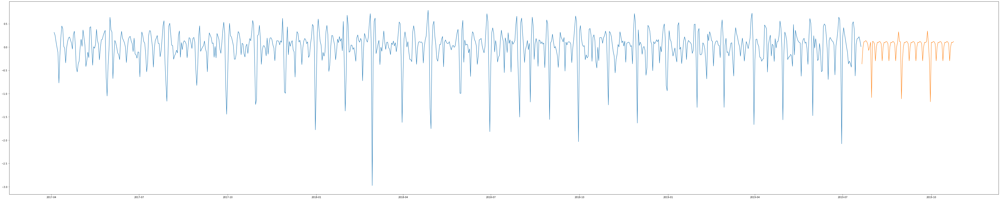

In [523]:
y_seg2_detrend_pred_df

plt.figure(figsize=(75,15))
plt.plot(df_seg2_detrended[2])
plt.plot(y_seg2_detrend_pred_df[0])

segment2 trend part

In [524]:
df_seg2_trend_temp=pd.DataFrame(decomp_seg2.trend)
df_seg2_trend=df_seg2_trend_temp['2017-04-04':'2019-07-20']
df_seg2_trend = pd.DataFrame(df_seg2_trend)

In [525]:
df_seg2_trend.tail()

,2
application_date,
2019-07-16,10.171391
2019-07-17,10.170101
2019-07-18,10.169126
2019-07-19,10.171890
2019-07-20,10.161991


In [403]:
seg2_trend_model = pm.auto_arima(df_seg2_trend[2][:'2019-07-20'], start_p=1, start_q=1,
                         test='adf',
                         max_p=1, max_q=1, m=30,
                         start_P=0, seasonal=True,
                         d=None, D=1, trace=True,stationary=False,
                         error_action='ignore',  
                         suppress_warnings=True, 
                         stepwise=True)

#######

seg2_trend_model_sarimax = sm.tsa.statespace.SARIMAX(df_seg2_trend[2][:'2019-07-20'],
                                                       #exog=pd.DataFrame(df_seg2_detrended[['monthend','monthmid']][:'2019-04-01']),
                                                       order=seg2_trend_model.order,
                                                       seasonal_order=seg2_trend_model.seasonal_order,
                                                       enforce_stationarity=False, enforce_invertibility=False,).fit()
print(seg2_trend_model_sarimax.summary())

######

y_seg2_trend_pred=seg2_trend_model_sarimax.predict( start='2019-04-02', end='2019-07-02', 
                                                       #exog = pd.DataFrame(df_seg2_detrended[['monthend','monthmid']]['2019-04-02':'2019-07-05']),
                                                       dynamic=False)
y_seg2_trend_pred_df=pd.DataFrame(y_seg2_trend_pred)

Fit ARIMA: order=(1, 0, 1) seasonal_order=(0, 1, 1, 30); AIC=-1522.642, BIC=-1499.901, Fit time=30.305 seconds
Fit ARIMA: order=(0, 0, 0) seasonal_order=(0, 1, 0, 30); AIC=197.980, BIC=207.076, Fit time=1.405 seconds
Fit ARIMA: order=(1, 0, 0) seasonal_order=(1, 1, 0, 30); AIC=-1311.683, BIC=-1293.490, Fit time=17.920 seconds
Fit ARIMA: order=(0, 0, 1) seasonal_order=(0, 1, 1, 30); AIC=-588.214, BIC=-570.021, Fit time=13.047 seconds
Fit ARIMA: order=(0, 0, 0) seasonal_order=(0, 1, 0, 30); AIC=231.801, BIC=236.349, Fit time=0.693 seconds
Fit ARIMA: order=(1, 0, 1) seasonal_order=(0, 1, 0, 30); AIC=-1402.791, BIC=-1384.598, Fit time=2.470 seconds
Fit ARIMA: order=(1, 0, 1) seasonal_order=(1, 1, 1, 30); AIC=-1520.850, BIC=-1493.560, Fit time=67.997 seconds
Fit ARIMA: order=(1, 0, 1) seasonal_order=(0, 1, 2, 30); AIC=-1520.968, BIC=-1493.679, Fit time=99.568 seconds
Fit ARIMA: order=(1, 0, 1) seasonal_order=(1, 1, 0, 30); AIC=-1486.100, BIC=-1463.359, Fit time=27.358 seconds
Fit ARIMA: ord

//anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                                 Statespace Model Results                                
Dep. Variable:                                 2   No. Observations:                  728
Model:             SARIMAX(2, 0, 2)x(0, 1, 1, 7)   Log Likelihood                 772.822
Date:                           Sun, 26 Jan 2020   AIC                          -1533.644
Time:                                   17:05:15   BIC                          -1506.244
Sample:                               04-04-2017   HQIC                         -1523.060
                                    - 04-01-2019                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.8769      0.024     78.171      0.000       1.830       1.924
ar.L2         -0.9210      0.024    -38.374

In [528]:
seg2_trend_model_sarimax = sm.tsa.statespace.SARIMAX(df_seg2_trend[2][:'2019-07-20'],
                                                       exog=pd.DataFrame(df_seg2_detrended[['monthend','monthmid']][:'2019-07-20']),
                                                       order=(0,0,0),seasonal_order=(0,1,0,30),
                                                       enforce_stationarity=False, enforce_invertibility=False,).fit()
print(seg2_trend_model_sarimax.summary())

######

y_seg2_trend_pred=seg2_trend_model_sarimax.predict( start='2019-07-21', end='2019-10-24', 
                                                       exog = pd.DataFrame(df_seg2_detrended_test[['monthend','monthmid']]['2019-07-21':'2019-10-24']),
                                                       dynamic=False)
y_seg2_trend_pred_df=pd.DataFrame(y_seg2_trend_pred)

//anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                            Statespace Model Results                            
Dep. Variable:                        2   No. Observations:                  838
Model:             SARIMAX(0, 1, 0, 30)   Log Likelihood                -122.376
Date:                  Sun, 26 Jan 2020   AIC                            250.753
Time:                          18:21:50   BIC                            264.833
Sample:                      04-04-2017   HQIC                           256.160
                           - 07-20-2019                                         
Covariance Type:                    opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
monthend      -0.0219      0.044     -0.502      0.615      -0.107       0.064
monthmid      -0.0911      0.054     -1.701      0.089      -0.196       0.014
sigma2         0.0793      0.003    

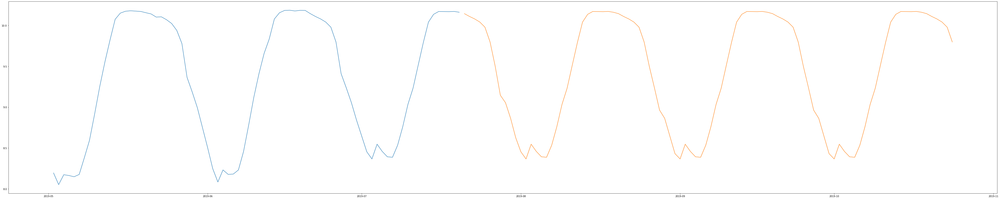

In [529]:
plt.figure(figsize=(75,15))
plt.plot(df_seg2_trend[2]['2019-05-02':'2019-07-20'])
plt.plot(y_seg2_trend_pred_df[0])

In [530]:
y_seg2_pred=y_seg2_trend_pred_df.copy()
y_seg2_pred=y_seg2_pred+y_seg2_detrend_pred_df

In [531]:
y_seg2_pred_original=np.exp(y_seg2_pred)
df_seg2_train=np.exp(df_seg2log_train)

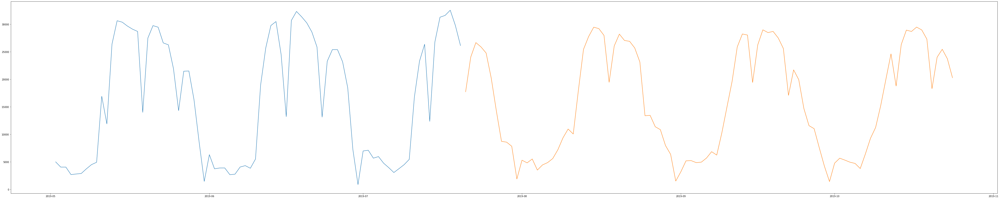

In [532]:
plt.figure(figsize=(75,15))
plt.plot(df_seg2_train[2]['2019-05-02':'2019-07-20'])
plt.plot(y_seg2_pred_original[0])

In [492]:
print('ARIMA model MSE:{}'.format(100*np.mean((abs(df_seg2_train[2]['2019-05-02':'2019-07-20']-
                                          y_seg2_pred_original[0])/df_seg2_train[2]['2019-05-02':'2019-07-20']))))

ARIMA model MSE:27.60050541902436


In [533]:
y_seg2_pred_original.to_csv('y_seg2_pred_original.csv')